重回帰分析やる


In [1]:
params_d = {
    "number_of_iterations": [
        10,
        20,
        30,
        40,
        50,
        60,
        70,
        80,
        90,
        100,
        110,
        120,
        130,
        140,
        150,
        160,
        170,
        180,
        190,
        200,
    ],
    "number_of_pivots": [
        5,
        10,
        15,
        20,
        25,
        30,
        35,
        40,
        45,
        50,
        55,
        60,
        65,
        70,
        75,
        80,
        85,
        90,
        95,
        100,
    ],
    "eps": [
        0.05,
        0.1,
        0.15000000000000002,
        0.2,
        0.25,
        0.30000000000000004,
        0.35000000000000003,
        0.4,
        0.45,
        0.5,
        0.55,
        0.6000000000000001,
        0.65,
        0.7000000000000001,
        0.75,
        0.8,
        0.8500000000000001,
        0.9,
        0.9500000000000001,
        1.0,
    ],
}

In [22]:
import pandas as pd
from config.paths import root_path
from config.quality_metrics import qm_names
from sklearn.multioutput import MultiOutputRegressor
import lightgbm as lgb
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

In [3]:
dataset_names = ["les_miserables", "1138_bus", "USpowerGrid"]
params_names = sorted(["number_of_pivots", "number_of_iterations", "eps"])
qm_names_ss = [f"{qm_name}_ss" for qm_name in qm_names]

In [35]:
import optuna

b_params = []
study = optuna.load_study(
    study_name=",".join(qm_names),
    storage="sqlite:////Users/fuga_takata/dev/vdslab-project/hyperparameter_optimization/data/SS/USpowerGrid/25a73bb2-ae88-4b4a-9f14-0acf4ee3b624/optimization/100trials-fixed_seed.sql",
)
for b_trial in study.best_trials:
    b_params.append(b_trial.user_attrs["params"])

In [5]:
data = pd.DataFrame()

for dataset_name in dataset_names:
    data_path = root_path.joinpath(
        f"data/experiments/regression_analysis/grid/{dataset_name}.pkl"
    )
    datum = pd.read_pickle(data_path)
    data = pd.concat([data, datum])

In [6]:
data.shape

(240000, 13)

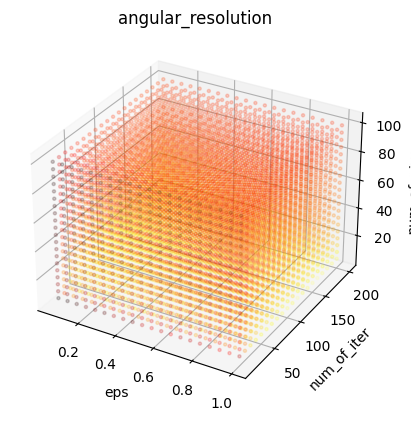

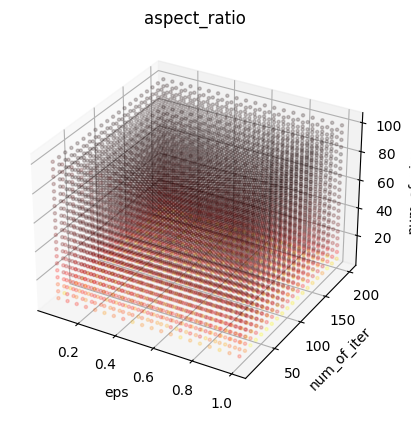

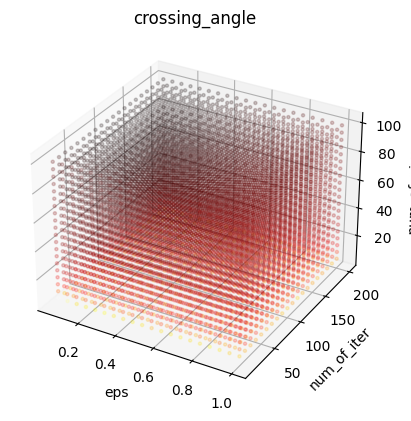

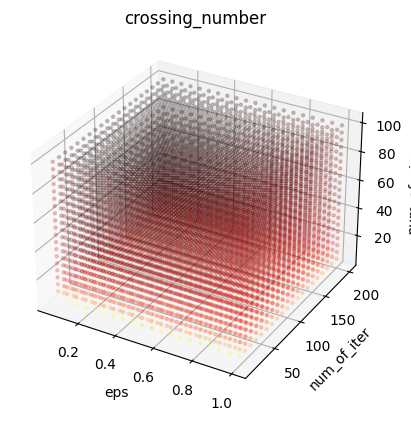

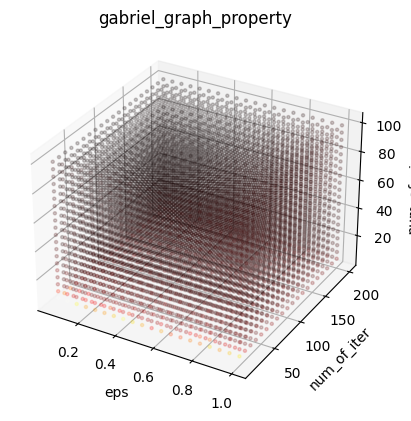

...

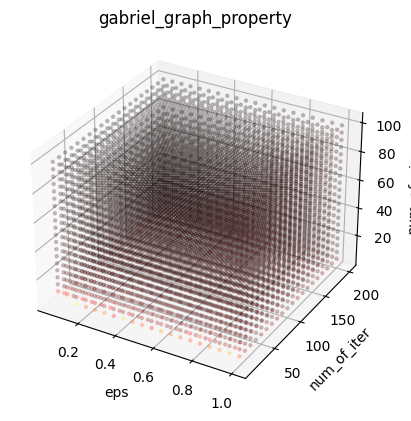

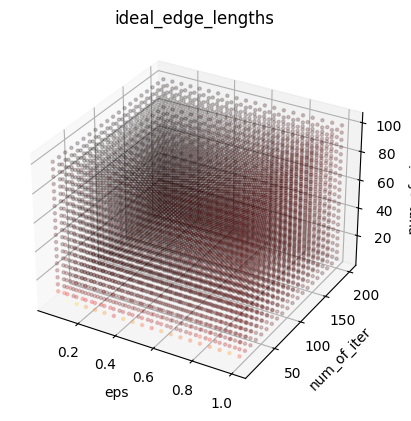

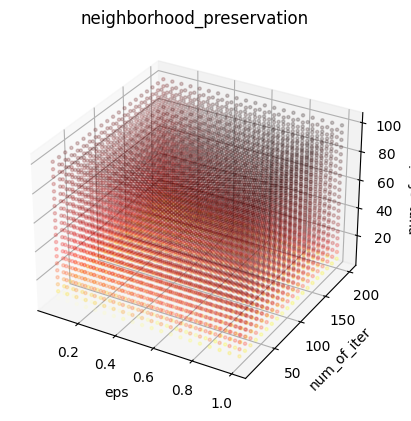

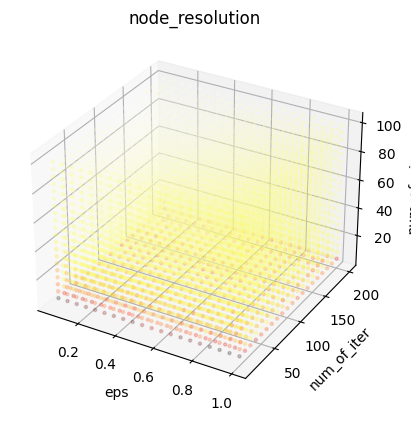

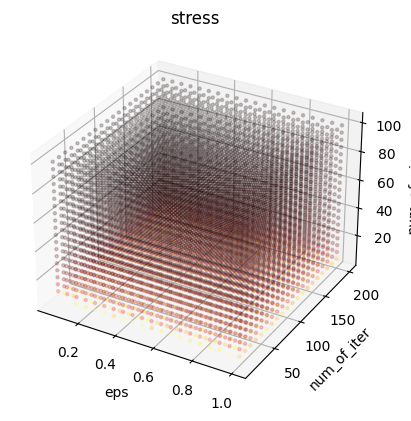

In [80]:
kf = KFold(n_splits=5, shuffle=True, random_state=0)
sss = {
    dataset_name: {qm_name: StandardScaler() for qm_name in qm_names}
    for dataset_name in dataset_names
}

mean_squared_errors_train = []
mean_squared_errors_test = []
zansa_train = {}
zansa_test = {}
for qm_name in qm_names:
    pass
zansa_data = []


data[qm_names_ss] = 0

for train_index, test_index in kf.split(data):
    train_data = data.iloc[train_index]
    test_data = data.iloc[test_index]
    for dataset_name in dataset_names:
        dd = train_data.query(f'dataset_name == "{dataset_name}"')
        for qm_name in qm_names:
            qd = dd[qm_name]
            sss[dataset_name][qm_name].fit(qd.values.reshape(-1, 1))
    for dataset_name in dataset_names:
        dd = data.query(f'dataset_name == "{dataset_name}"')
        for qm_name in qm_names:
            qd = dd[qm_name]
            data.loc[dd.index, [f"{qm_name}_ss"]] = sss[dataset_name][
                qm_name
            ].transform(qd.values.reshape(-1, 1))

    reg = MultiOutputRegressor(estimator=lgb.LGBMRegressor())

    # 更新されないから更新
    train_data = data.iloc[train_index]
    test_data = data.iloc[test_index]
    x_train, x_test = train_data[params_names], test_data[params_names]
    y_train, y_test = train_data[qm_names_ss], test_data[qm_names_ss]

    reg.fit(x_train, y_train)

    y_train_pred = reg.predict(x_train)
    y_test_pred = reg.predict(x_test)

    mean_squared_errors_train.append(mean_squared_error(y_train, y_train_pred))
    mean_squared_errors_test.append(mean_squared_error(y_test, y_test_pred))

    zansa_r = {"type": "train"}
    for qm_name_ss in qm_names_ss:
        zansa_r[qm_name_ss] = 0
    for (i, row), train_p in zip(y_train.iterrows(), y_train_pred):
        d = row.to_dict()
        for qm_name_ss, p in zip(qm_names_ss, train_p):
            zansa_r[qm_name_ss] += (d[qm_name_ss] - p) ** 2
    for qm_name_ss in qm_names_ss:
        zansa_r[qm_name_ss] = zansa_r[qm_name_ss] / len(y_train_pred)
    zansa_data.append(zansa_r)

    zansa_r = {"type": "test"}
    for qm_name_ss in qm_names_ss:
        zansa_r[qm_name_ss] = 0
    for (i, row), test_p in zip(y_test.iterrows(), y_test_pred):
        d = row.to_dict()
        for qm_name_ss, p in zip(qm_names_ss, test_p):
            zansa_r[qm_name_ss] += (d[qm_name_ss] - p) ** 2
    for qm_name_ss in qm_names_ss:
        zansa_r[qm_name_ss] = zansa_r[qm_name_ss] / len(y_test_pred)
    zansa_data.append(zansa_r)

    # vis
    params_list = []
    for noi in params_d["number_of_iterations"]:
        for nop in params_d["number_of_pivots"]:
            for eps in params_d["eps"]:
                params_list.append([eps, noi, nop])

    pred_results = reg.predict(params_list)
    reg_result_df_data = []
    for params, pred_result in zip(params_list, pred_results):
        r = {
            "eps": params[0],
            "number_of_iterations": params[1],
            "number_of_pivots": params[2],
        }
        for qm_name, pred_r in zip(qm_names, pred_result):
            r[qm_name] = pred_r
        reg_result_df_data.append(r)

    reg_result_df = pd.DataFrame(reg_result_df_data)

    for qm_name in qm_names:
        fig = plt.figure()
        ax = fig.add_subplot(111, projection="3d")
        ax.set_xlabel("eps")
        ax.set_ylabel("num_of_iter")
        ax.set_zlabel("num_of_pivots")
        ax.set_title(qm_name)
        ax.scatter(
            xs=reg_result_df["eps"],
            ys=reg_result_df["number_of_iterations"],
            zs=reg_result_df["number_of_pivots"],
            c=reg_result_df[qm_name],
            cmap=plt.hot(),
            alpha=0.2,
            s=5,
        )
        # ax.scatter(
        #     xs=[a["eps"] for a in b_params],
        #     ys=[a["number_of_iterations"] for a in b_params],
        #     zs=[a["number_of_pivots"] for a in b_params],
        #     c="lime",
        #     alpha=0.5,
        #     s=5,
        # )
        plt.show()

In [8]:
zansa_df = pd.DataFrame(zansa_data)
display(zansa_df.sort_values(["type"]))

,type,angular_resolution_ss,aspect_ratio_ss,crossing_angle_ss,crossing_number_ss,gabriel_graph_property_ss,ideal_edge_lengths_ss,neighborhood_preservation_ss,node_resolution_ss,stress_ss
1,test,0.647494,0.805143,0.346500,0.397216,0.654636,0.705639,0.348409,0.936687,0.327841
3,test,0.636132,0.789012,0.324362,0.372840,0.680011,0.717249,0.339165,0.917703,0.316250
5,test,0.648703,0.786153,0.326467,0.376217,0.651514,0.740737,0.344032,0.932380,0.339651
7,test,0.640883,0.798774,0.337744,0.390252,0.667677,0.732580,0.342145,0.924295,0.319419
9,test,0.640362,0.796588,0.318788,0.369112,0.830234,0.769998,0.345092,0.922558,0.348345
0,train,0.635395,0.784878,0.324002,0.374160,0.665965,0.709864,0.340424,0.916042,0.319383
2,train,0.635832,0.782863,0.326487,0.375997,0.662869,0.706896,0.341387,0.914820,0.318108
4,train,0.633287,0.779799,0.325536,0.374919,0.667150,0.704142,0.339971,0.916572,0.315793
6,train,0.634442,0.782374,0.323646,0.372988,0.664824,0.711270,0.340288,0.916721,0.317473
8,train,0.632372,0.781653,0.325461,0.374936,0.658120,0.700879,0.338628,0.915462,0.315005


In [9]:
reg.predict([[0.1, 200, 100]])

array([[-0.39671098, -0.35382875, -1.11479432, -0.957035  , -0.44637189,
        -0.59953517, -0.4631055 ,  0.19981017, -0.55445672]])

In [10]:
reg.predict([[0.1, 200, 10]])

array([[ 1.26206209,  0.80543899,  1.06609444,  0.94761388,  0.39356844,
        -0.41647197,  1.88895568, -0.34046309,  0.99890351]])

In [11]:
reg.estimators_

[LGBMRegressor(),
 LGBMRegressor(),
 LGBMRegressor(),
 LGBMRegressor(),
 LGBMRegressor(),
 LGBMRegressor(),
 LGBMRegressor(),
 LGBMRegressor(),
 LGBMRegressor()]

In [12]:
p = {
    "number_of_iterations": [
        10,
        20,
        30,
        40,
        50,
        60,
        70,
        80,
        90,
        100,
        110,
        120,
        130,
        140,
        150,
        160,
        170,
        180,
        190,
        200,
    ],
    "number_of_pivots": [
        5,
        10,
        15,
        20,
        25,
        30,
        35,
        40,
        45,
        50,
        55,
        60,
        65,
        70,
        75,
        80,
        85,
        90,
        95,
        100,
    ],
    "eps": [
        0.05,
        0.1,
        0.15000000000000002,
        0.2,
        0.25,
        0.30000000000000004,
        0.35000000000000003,
        0.4,
        0.45,
        0.5,
        0.55,
        0.6000000000000001,
        0.65,
        0.7000000000000001,
        0.75,
        0.8,
        0.8500000000000001,
        0.9,
        0.9500000000000001,
        1.0,
    ],
}

In [13]:
params_list = []
for noi in p["number_of_iterations"]:
    for nop in p["number_of_pivots"]:
        for eps in p["eps"]:
            params_list.append([eps, noi, nop])

pred_results = reg.predict(params_list)
reg_result_df_data = []
for params, pred_result in zip(params_list, pred_results):
    r = {
        "eps": params[0],
        "number_of_iterations": params[1],
        "number_of_pivots": params[2],
    }
    for qm_name, pred_r in zip(qm_names, pred_result):
        r[qm_name] = pred_r
    reg_result_df_data.append(r)

reg_result_df = pd.DataFrame(reg_result_df_data)

In [14]:
cl = None
for qm_name in qm_names:
    if cl is None:
        cl = reg_result_df[qm_name]
        continue
    cl += reg_result_df[qm_name]

In [15]:
reg_result_df

,eps,number_of_iterations,number_of_pivots,angular_resolution,aspect_ratio,crossing_angle,crossing_number,gabriel_graph_property,ideal_edge_lengths,neighborhood_preservation,node_resolution,stress
0,0.05,10,5,37.601311,0.728702,5.022824,5.334505,11.536813,11.462237,2.846549,-2.149697,5.122097
1,0.10,10,5,36.104266,0.323713,4.548969,4.891856,12.089994,10.494406,2.838186,-1.910954,4.880969
2,0.15,10,5,27.589848,0.875364,3.269002,3.713139,9.076440,7.582573,2.760647,-1.828834,3.943662
3,0.20,10,5,22.108615,0.708166,3.328291,3.714335,5.648601,5.973490,2.690482,-1.845299,3.651433
4,0.25,10,5,24.374376,1.112834,3.615871,4.001355,5.994264,6.027373,2.705959,-1.896061,4.454587
...,...,...,...,...,...,...,...,...,...,...,...,...
7995,0.80,200,100,-3.188724,-0.324678,-0.573116,-0.549855,-0.175859,0.130770,-0.878938,0.108307,-0.440450
7996,0.85,200,100,-2.893748,-0.268241,-0.515438,-0.460825,-0.113371,0.173859,-0.861029,0.057716,-0.424905
7997,0.90,200,100,-2.590157,-0.418042,-0.431430,-0.369829,-0.064981,0.283549,-0.832557,0.123484,-0.410704
7998,0.95,200,100,-2.291832,-0.343111,-0.399967,-0.269855,0.019497,0.380882,-0.852140,0.028357,-0.393325


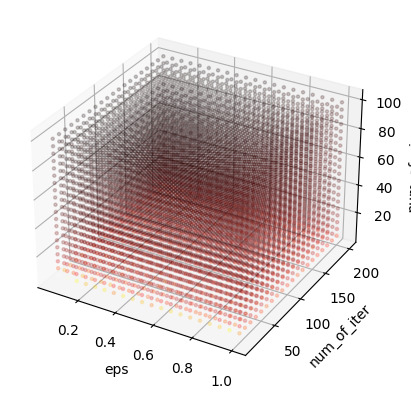

In [17]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

# for qm_name in qm_names:
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
ax.set_xlabel("eps")
ax.set_ylabel("num_of_iter")
ax.set_zlabel("num_of_pivots")
# ax.set_title(qm_name)
ax.scatter(
    xs=reg_result_df["eps"],
    ys=reg_result_df["number_of_iterations"],
    zs=reg_result_df["number_of_pivots"],
    c=cl,
    cmap=plt.hot(),
    alpha=0.2,
    s=5,
)

<img width="30%" alt="image.png (178.8 kB)" src="https://img.esa.io/uploads/production/attachments/8704/2023/07/24/57714/402175a0-22bd-4c08-99cc-20732852ae3a.png">
<img width="30%" alt="image.png (170.2 kB)" src="https://img.esa.io/uploads/production/attachments/8704/2023/07/24/57714/80a8a8c5-3874-4ac1-8a8f-b956c4f3300e.png">
<img width="30%" alt="image.png (171.9 kB)" src="https://img.esa.io/uploads/production/attachments/8704/2023/07/24/57714/4c99bbff-8aa3-47b0-8ed7-5f3abe710c0b.png">
<img width="30%" alt="image.png (171.4 kB)" src="https://img.esa.io/uploads/production/attachments/8704/2023/07/24/57714/92fbba9e-b176-423a-88e6-a375dbe2dd29.png">
<img width="30%" alt="image.png (165.5 kB)" src="https://img.esa.io/uploads/production/attachments/8704/2023/07/24/57714/af096f0c-99aa-4912-8473-97421b79f818.png">
<img width="30%" alt="image.png (167.9 kB)" src="https://img.esa.io/uploads/production/attachments/8704/2023/07/24/57714/ea3ec147-a949-439a-878c-9ddf7dc252cb.png">
<img width="30%" alt="image.png (177.2 kB)" src="https://img.esa.io/uploads/production/attachments/8704/2023/07/24/57714/2e5de24e-90c5-4e24-8b0b-721dfd675cad.png">
<img width="30%" alt="image.png (156.0 kB)" src="https://img.esa.io/uploads/production/attachments/8704/2023/07/24/57714/fcba0d57-8ee1-4334-869a-07f2a4826325.png">
<img width="30%" alt="image.png (167.5 kB)" src="https://img.esa.io/uploads/production/attachments/8704/2023/07/24/57714/c9e8a473-9b04-42b6-ab4c-512712d385b7.png">


In [36]:
len(study.trials)

1000

In [37]:
from optuna.distributions import FloatDistribution, IntDistribution

pstudy = optuna.create_study(
    study_name="pstudy",
    directions=["minimize" for _ in qm_names],
)

dis = {
    "eps": FloatDistribution(
        min(reg_result_df["eps"]), max(reg_result_df["eps"])
    ),
    "number_of_iterations": IntDistribution(
        min(reg_result_df["number_of_iterations"]),
        max(reg_result_df["number_of_iterations"]),
    ),
    "number_of_pivots": IntDistribution(
        min(reg_result_df["number_of_pivots"]),
        max(reg_result_df["number_of_pivots"]),
    ),
}


trials = []
for i, row in tqdm(reg_result_df.iterrows()):
    qualities = dict([[qm_name, row[qm_name]] for qm_name in qm_names])
    params = dict(
        [[params_name, row[params_name]] for params_name in params_names]
    )

    trial = optuna.trial.create_trial(
        params=params,
        distributions=dis,
        values=[row[qm_name] for qm_name in qm_names],
    )
    trials.append(trial)
pstudy.add_trials(trials=trials)

[I 2023-07-29 01:49:04,047] A new study created in memory with name: pstudy
8000it [00:01, 6310.65it/s]


In [48]:
data.columns

Index(['angular_resolution', 'aspect_ratio', 'crossing_angle',
       'crossing_number', 'gabriel_graph_property', 'ideal_edge_lengths',
       'neighborhood_preservation', 'node_resolution', 'stress',
       'number_of_pivots', 'number_of_iterations', 'eps', 'dataset_name',
       'angular_resolution_ss', 'aspect_ratio_ss', 'crossing_angle_ss',
       'crossing_number_ss', 'gabriel_graph_property_ss',
       'ideal_edge_lengths_ss', 'neighborhood_preservation_ss',
       'node_resolution_ss', 'stress_ss'],
      dtype='object')

In [53]:
from optuna.distributions import FloatDistribution, IntDistribution

pstudy2 = optuna.create_study(
    study_name="pstudy",
    directions=["minimize" for _ in qm_names],
)

dis2 = {
    "eps": FloatDistribution(min(data["eps"]), max(data["eps"])),
    "number_of_iterations": IntDistribution(
        min(data["number_of_iterations"]),
        max(data["number_of_iterations"]),
    ),
    "number_of_pivots": IntDistribution(
        min(reg_result_df["number_of_pivots"]),
        max(reg_result_df["number_of_pivots"]),
    ),
}
data2 = data.drop_duplicates(
    subset=[
        "number_of_pivots",
        "number_of_iterations",
        "eps",
        "dataset_name",
    ],
    keep="last",
)

trials2 = []
for i, row in tqdm(data2.iterrows()):
    params = dict(
        [[params_name, row[params_name]] for params_name in params_names]
    )

    trial = optuna.trial.create_trial(
        params=params,
        distributions=dis,
        values=[row[f"{qm_name}_ss"] for qm_name in qm_names],
    )
    trials.append(trial)
pstudy2.add_trials(trials=trials)

[I 2023-07-29 07:14:08,941] A new study created in memory with name: pstudy
24000it [00:02, 8888.13it/s]


In [40]:
r_b_params = [bt.params for bt in tqdm(pstudy.best_trials)]

100%|██████████| 1778/1778 [00:00<00:00, 1046075.54it/s]


In [54]:
r_b_params2 = [bt.params for bt in tqdm(pstudy2.best_trials)]

KeyboardInterrupt: 

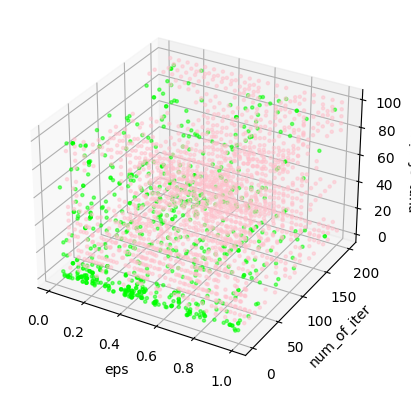

In [42]:
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
ax.set_xlabel("eps")
ax.set_ylabel("num_of_iter")
ax.set_zlabel("num_of_pivots")
ax.scatter(
    xs=[a["eps"] for a in b_params],
    ys=[a["number_of_iterations"] for a in b_params],
    zs=[a["number_of_pivots"] for a in b_params],
    c="lime",
    alpha=0.5,
    s=5,
)
ax.scatter(
    xs=[a["eps"] for a in r_b_params],
    ys=[a["number_of_iterations"] for a in r_b_params],
    zs=[a["number_of_pivots"] for a in r_b_params],
    c="pink",
    alpha=0.5,
    s=5,
)
plt.show()

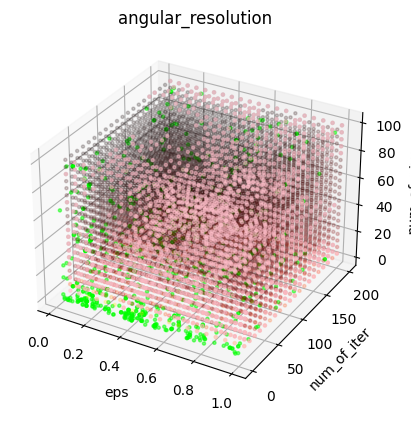

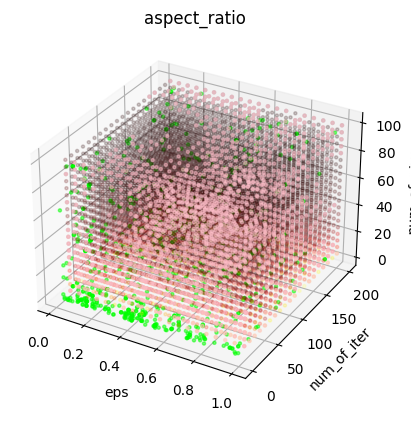

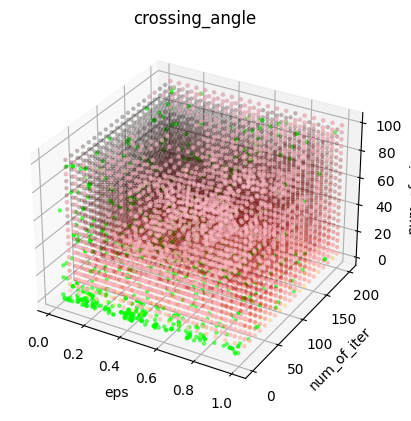

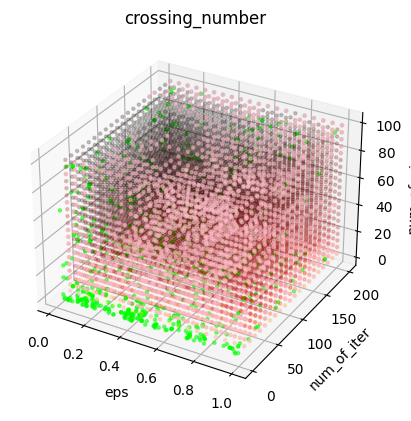

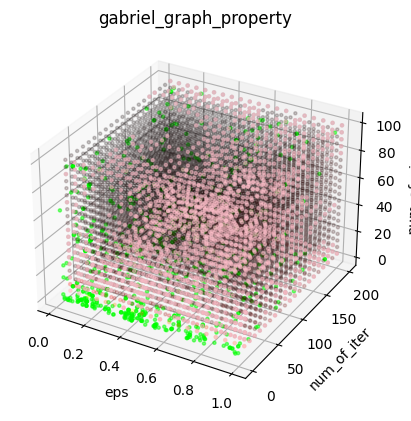

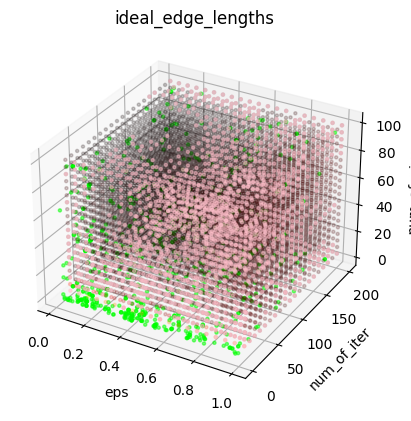

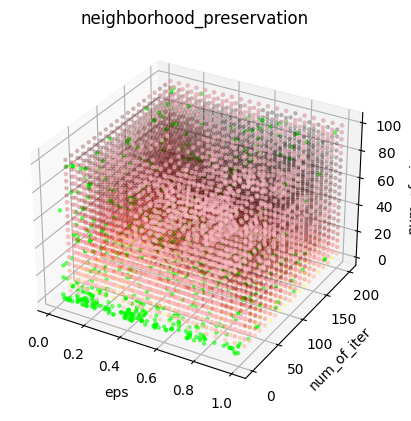

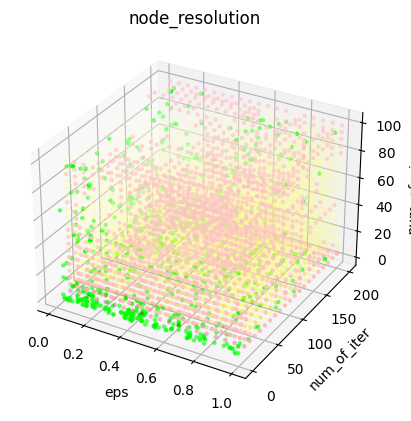

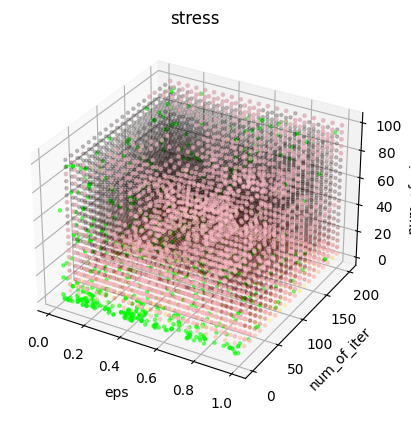

In [41]:
for qm_name in qm_names:
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d")
    ax.set_xlabel("eps")
    ax.set_ylabel("num_of_iter")
    ax.set_zlabel("num_of_pivots")
    ax.set_title(qm_name)
    ax.scatter(
        xs=reg_result_df["eps"],
        ys=reg_result_df["number_of_iterations"],
        zs=reg_result_df["number_of_pivots"],
        c=reg_result_df[qm_name],
        cmap=plt.hot(),
        alpha=0.2,
        s=5,
    )
    ax.scatter(
        xs=[a["eps"] for a in b_params],
        ys=[a["number_of_iterations"] for a in b_params],
        zs=[a["number_of_pivots"] for a in b_params],
        c="lime",
        alpha=0.5,
        s=5,
    )
    ax.scatter(
        xs=[a["eps"] for a in r_b_params],
        ys=[a["number_of_iterations"] for a in r_b_params],
        zs=[a["number_of_pivots"] for a in r_b_params],
        c="pink",
        alpha=0.5,
        s=5,
    )
    plt.show()

In [60]:
reg.estimators_[0]

array([1121,  944,  935], dtype=int32)

importance of  ['eps', 'number_of_iterations', 'number_of_pivots']
angular_resolution [1121  944  935]
aspect_ratio [1114 1057  829]
crossing_angle [1161 1039  800]
crossing_number [1144 1001  855]
gabriel_graph_property [1267  956  777]
ideal_edge_lengths [1076 1058  866]
neighborhood_preservation [1233  853  914]
node_resolution [1125 1007  868]
stress [1220 1102  678]


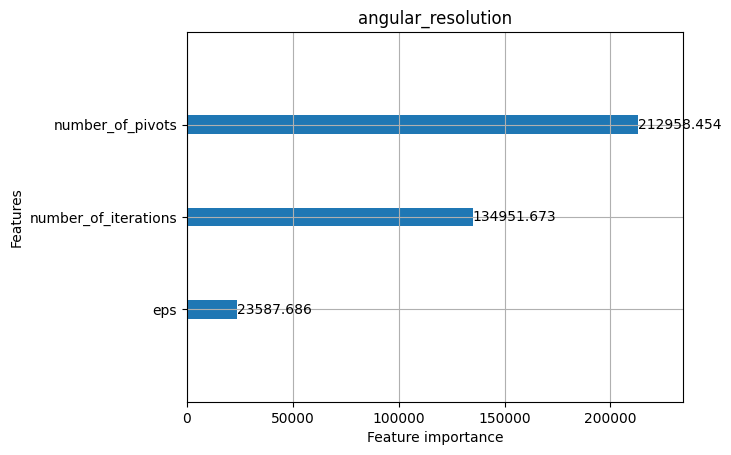

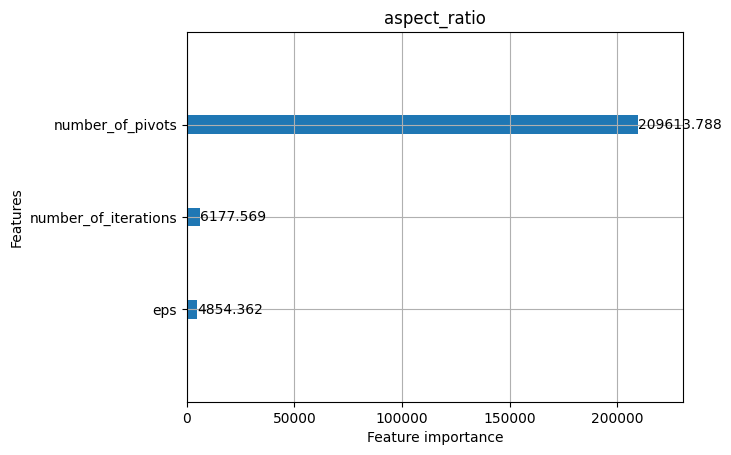

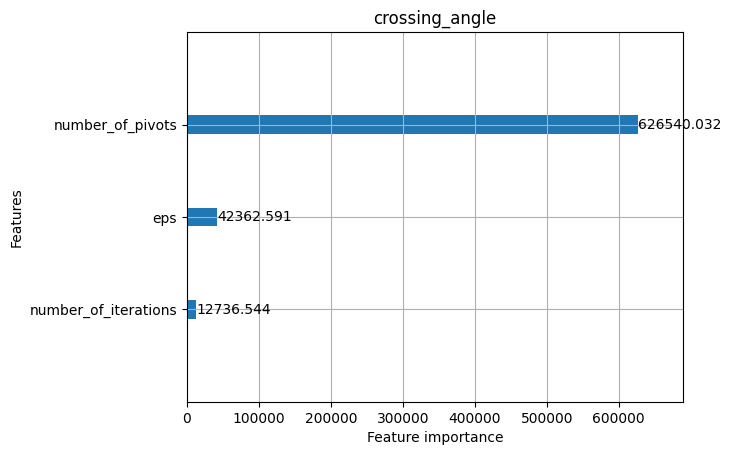

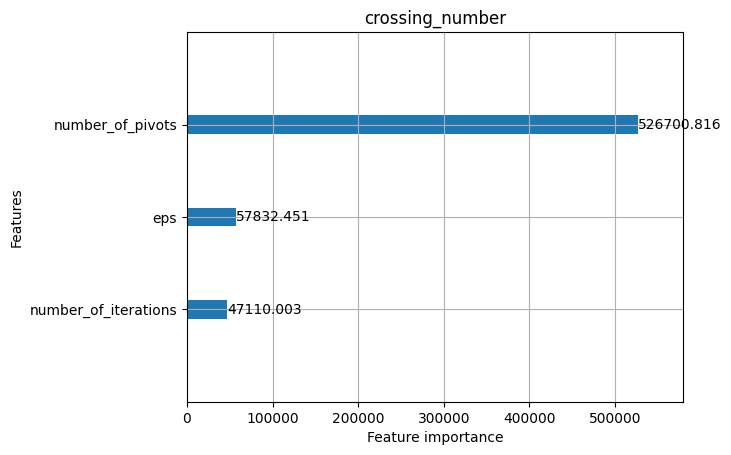

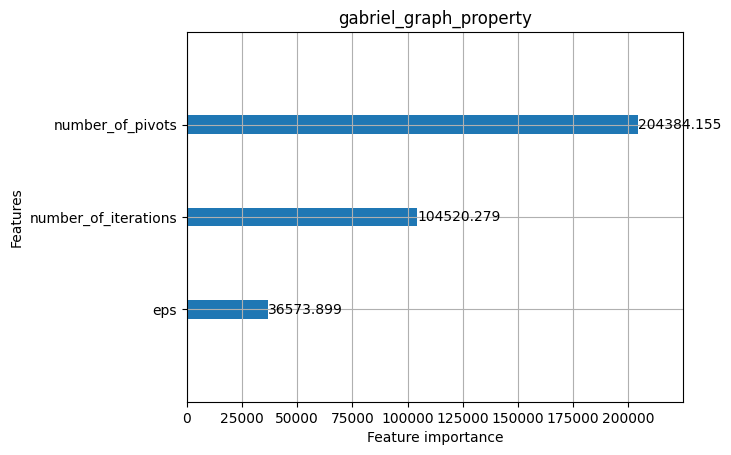

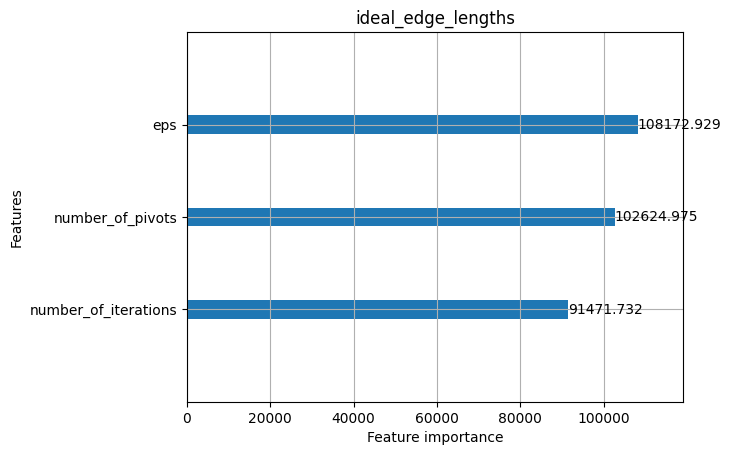

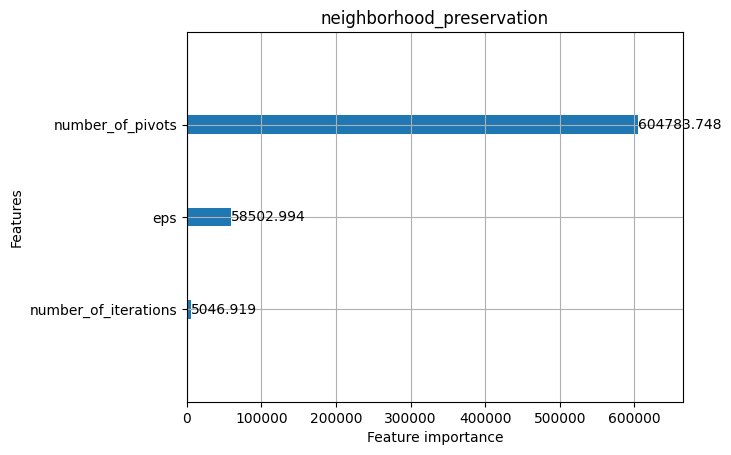

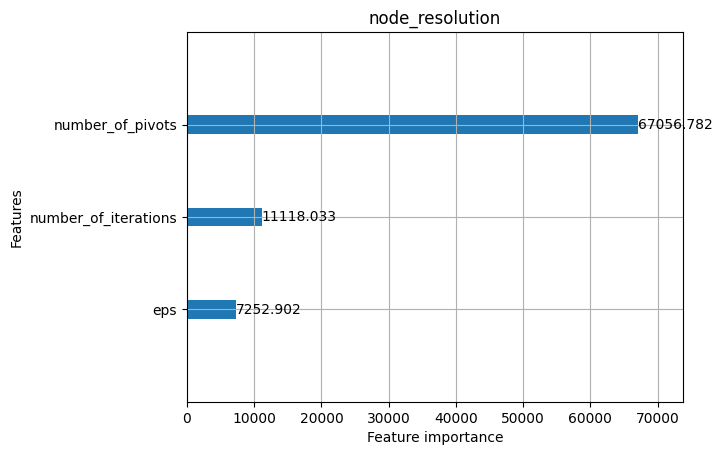

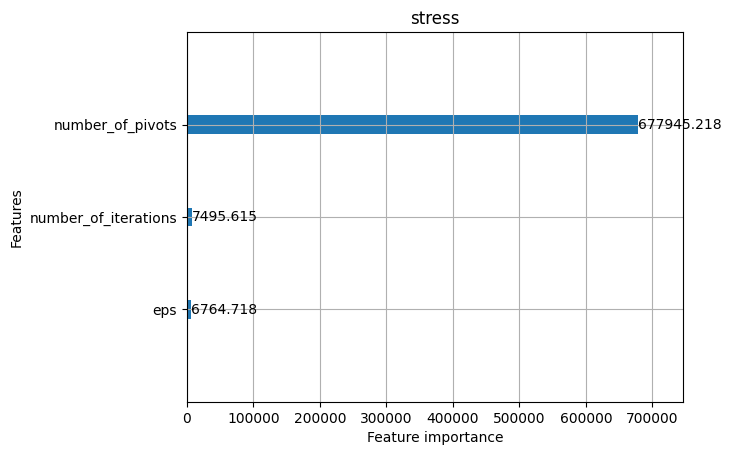

In [77]:
print("importance of ", params_names)
for qm_name, r in zip(qm_names, reg.estimators_):
    print(qm_name, r.feature_importances_)
    lgb.plot_importance(r, importance_type="gain", title=qm_name)